In [1]:
########################################################
# Copyright (c) 2022 Meta Platforms, Inc. and affiliates
#
# Holotorch is an optimization framework for differentiable wave-propagation written in PyTorch 
# This work is licensed under a Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License.
#
# Contact:
# florianschiffers (at) gmail.com
# ocossairt ( at ) fb.com
#
########################################################

In [2]:
import scipy.io
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

import os, sys, torch, glob, urllib, zipfile, pathlib
import matplotlib.pyplot as plt

print(os.getcwd())
sys.path.append('..\\') # Make sure holotorch_internal is imported

C:\Users\Lower\PycharmProjects\3DIM\HoloTorch\.slm


In [3]:
import numpy as np
import holotorch.CGH_Datasets.Single_Image_Dataset as Single_Image_Dataset
import holotorch.CGH_Datasets.Factory_Dataset as Factory_Dataset
from holotorch.CGH_Datatypes.IntensityField import IntensityField
from holotorch.ComponentWrapper.PARAM_DATASET import PARAM_DATASET
from holotorch.utils.Enumerators import *

In [4]:
# from notebook.services.config import ConfigManager
# cm = ConfigManager()
# cm.update('livereveal', {
#         'scroll': True,
# })

# Holotorch

## differentiable coherent light transport in PyTorch


Main Developer: Florian Schiffers$^{1,2}$, Oliver Cossairt$^{1,2}$

Co-Developer: Grace Kuo$^2$, Lionel Fiske$^{1,2}$, Praneeth Chakravarthula$^3$, Ethan Tseng$^3$, Seung-Hwan Baek$^{3,4}$, Gang Li$^2$, Jipeng Zhang$^2$, Andrew Maimone$^2$, Felix Heide $^3$, Doug Lanman$^3$, Nathan Matsuda$^2$

$^1$: Northwestern University
$^2$: META Reality Labs
$^3$: Princeston University
$^4$: POSTECH

Contact: florian.schiffers@u.northwestern.edu | olivercossairt@gmail.com

GitHub Link: TO BE CREATED

# What is Holotorch?

Holotorch provides an easy to customize optimization toolkit for holographic display systems based on Automatic Differentiation (PyTorch) 

- Abstracted optimization framework based on PyTorch Lightning (which e.g. enables simple Multi-GPU support)
- Pre-implemented dataset-classes (2D images, focal stack) with automated pre-loading to RAM/GPU
- Datatypes for electric fields (storing spectral and spatial information) and easy visualization methods
- Many pre-built optical components/propagators that allow to assemble an optical path for forward modeling
- Streamlined optimization routines + logging/saving of information, plots etc.
- Hardware implementations for Camera (Ximea, Flir) and Display (using slmPy)
    - Capture routines to create datasets for Setup Calibration

# Why do you want to use Holotorch?

- Beginners: Easy to way to get started in the world of Computer Generated Holography without having to write a lot code
- Researchers: Fast prototyping of new optical models without “reinventing the wheel”
- Tested functions for coherent light-transport (ASM, Fresnel, HOEs, FT-lens integrated with wavelength depedency)
- “Click through” example-notebooks for many existing components and setups in the framework

# What have we implemented (a few examples)?

- Double-Phase Encoding (DPAC)
- Phase-Retrieval for Near-Eye (ASM) and Far-Field (Fourier) Holography 
- (Neural) Etendue Expansion
- Partially Coherent Holography
- Camera-in-the-Loop (full documentation + example dataset in the next iteration of holotorch)

# Basics

In holotorch we're using SI units for everything

In [5]:
import holotorch

In [6]:
from holotorch.utils.units import * # E.g. to get nm, um, mm etc.
print("10mm : ", 10*mm, "in m")
print(" 1nm : ", 1*nm, "in m")

10mm :  0.01 in m
 1nm :  1e-09 in m


 ### Let's introduce the electric field module

In [7]:
from holotorch.CGH_Datatypes.ElectricField import ElectricField
# ElectricFields are 6D objects: 
# B x T x P x C x H x W
# BATCH x TIME x PUPIL (lightfields) x Channel (Wavelength) x Height x Width

In [8]:
N = 1024
field_data = torch.zeros(1,1,1,1,N,N) + 0j # 0j to make it complex

In [9]:
# Set ones to the field
field_data[...,N//4 : 3 * N//4, N//4 : 3 * N//4] = 1

In [10]:
# Cast into our Holotorch Datatype
field_input = ElectricField(
    data = field_data, 
    wavelengths = 532 * nm,
    spacing = 8 * um,
)

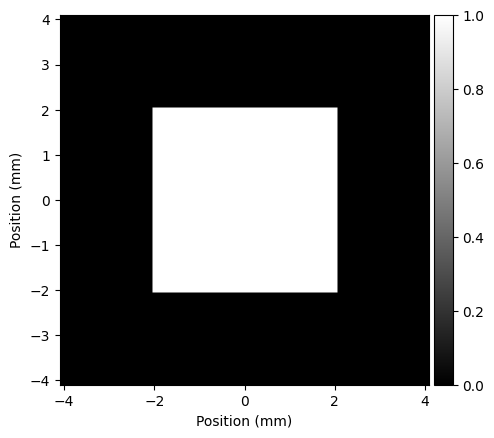

In [11]:
field_input.visualize(flag_axis=True)

Plotting can take a lot of time if the image size is large.
<br>
We can reduce the rendering time by downsampling our fields.

In [12]:
print(field_input.spacing)
print(field_input.shape)
downsampled_field = field_input.rescale(0.25)
print(downsampled_field.spacing)
print(downsampled_field.shape)

Spacing Container: torch.Size([1, 1, 2])
tensor([[[8.0000e-06, 8.0000e-06]]])
torch.Size([1, 1, 1, 1, 1024, 1024])
Spacing Container: torch.Size([1, 1, 2])
tensor([[[3.2000e-05, 3.2000e-05]]])
torch.Size([1, 1, 1, 1, 256, 256])


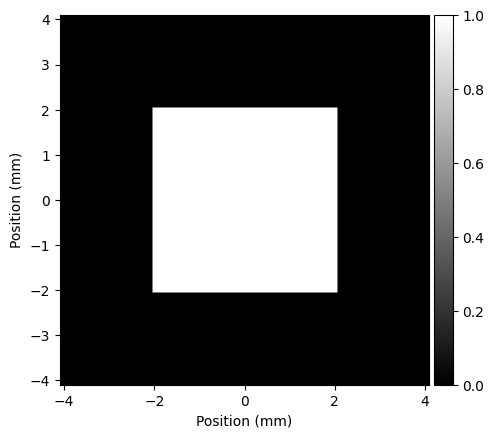

In [13]:
downsampled_field.visualize(flag_axis=True) 

### ASM - Propagator

$$
E(x, y, z)=\iint_{-\infty}^{\infty} \hat{E}\left(f_{x}, f_{y}, 0\right) e^{i k z \sqrt{1-\lambda^{2}\left(f_{x}^{2}+f_{y}^{2}\right)} e^{i 2} \pi\left(f_{x} x+f_{y} y\right)} d f_{x} d f_{y}
$$

$$
E\left(x, y, z_{2}\right)=\mathcal{F}^{-1}\left\{\mathcal{F}\left\{E\left(x, y, z_{1}\right)\right\} * \mathcal{F}\left\{H\left(x, y, z_{2}-z_{1}\right)\right\}\right\}
$$

$$
 \hat{H}(f_x, f_y) = e^{i k z \sqrt{1-\lambda^{2}\left(f_{x}^{2}+f_{y}^{2}\right)}} 
 $$
 $$\text{ or with fresnel approximation } 
 $$
 $$
 \hat{H}(f_x, f_y)_{\text{Fresnel}} = e^{i kz ( 1 + \frac{ f_{x}^{2}+f_{y}^{2} }{2k}  ) } 
$$



### ASM - Propagator

In [14]:
from holotorch.Optical_Propagators.ASM_Prop import ASM_Prop

In [15]:
asm_prop = ASM_Prop(
    init_distance = 50*mm,
)

In [16]:
# Cast data into Holotorch datatype 
field_propagated = asm_prop.forward(
    field = field_input
)

Let's visualize the propagated field

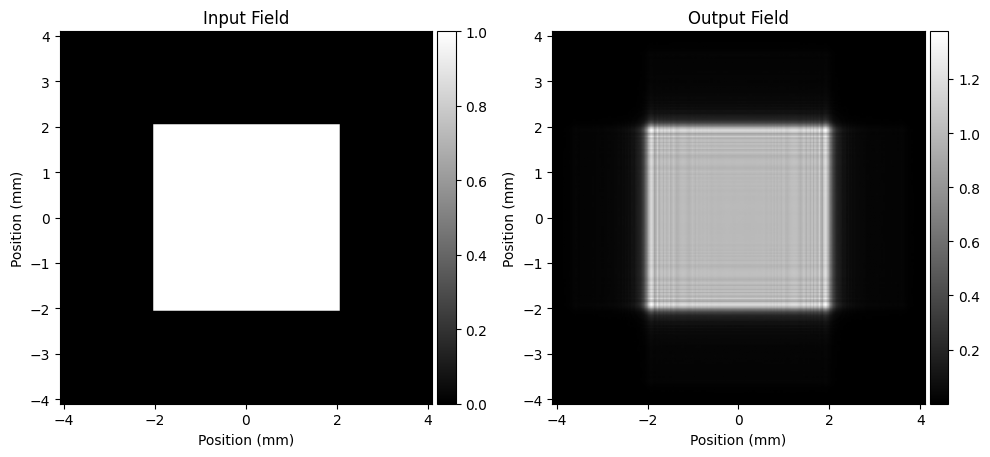

In [17]:
plt.figure(figsize=(10,10))
plt.subplot(121)
field_input.visualize(rescale_factor = 0.25, flag_colorbar=True,
                      flag_axis= True, title = "Input Field")
plt.subplot(122)
field_propagated.visualize(rescale_factor = 0.25,flag_colorbar=True,
                           flag_axis=True, title = "Output Field")
plt.tight_layout()

## We can also visualize the ASM-kernel

Let's reset the propagation distance

In [18]:
asm_prop.z = 100*mm

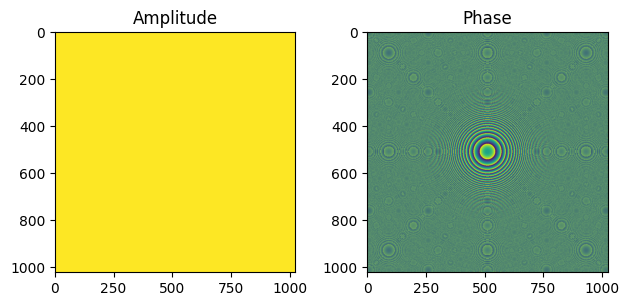

In [19]:
asm_prop.visualize_kernel(field = field_input)

What happens if we choose an even larger propagation distance?

In [20]:
asm_prop.z = 250*mm
# Long propagation lead to quicker aliasing of propagation kernel
# These frequencies are not supported by our grid,
# hence we need to bandlimit the kernel

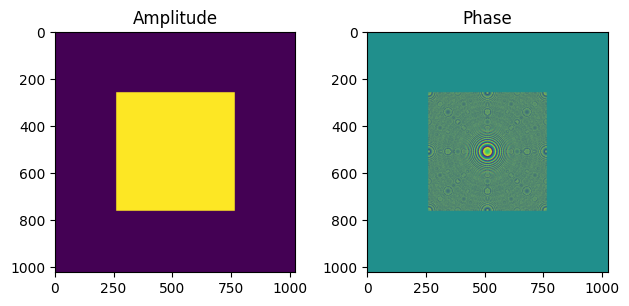

In [21]:
asm_prop.visualize_kernel(field = field_input)

### Build a 4F system

<center><img src="images/four_4_system.png" width="800"></center>

### Build a 4F system

In [22]:
# Import a Fourier Lens Component
from holotorch.Optical_Components.FT_Lens import FT_Lens

In [23]:
# Define the lenses in our 4f-system
lens1 = FT_Lens(focal_length  = 50 * mm)
lens2 = FT_Lens(focal_length  = 100 * mm)

In [24]:
N      = 1024   # Number of pixel of our image
# Create an image
field_data = torch.zeros(1,1,1,1,N,N) + 0j # 0j to make it complex

In [25]:
# Let's create a white rectangle in the center of our image
center = N//2   # Compute the center
size   = 20  
# Set ones to the field
field_data[..., center - size : center + size,
               center - size : center + size ] = 1

In [26]:
# Cast into our Holotorch Datatype
field_input = ElectricField(
    data        = field_data,
    wavelengths = 532 * nm,
    spacing     = 8 * um,
)

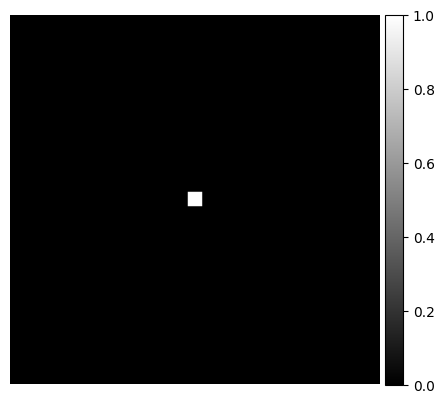

In [27]:
field_input.visualize()

Pass the field through both lenses

In [28]:
fourier_plane = lens1(field_input)
four_f_plane  = lens2(fourier_plane)

Let's have a look at the spacing at the various planes

In [29]:
print("Spacing at Input Plane: ",  "%.2f" % (float(field_input.spacing.data_tensor[...,0]) / um), "um")
print("Spacing at Fourier Plane", "%.2f" % (float(fourier_plane.spacing.data_tensor[...,0]) / um), "um")
print("Spacing at 4f-Plane: ",  "%.2f" % (float(four_f_plane.spacing.data_tensor[...,0]) / um), "um")

Spacing at Input Plane:  8.00 um
Spacing at Fourier Plane 3.25 um
Spacing at 4f-Plane:  16.00 um


Visualize our 4f system

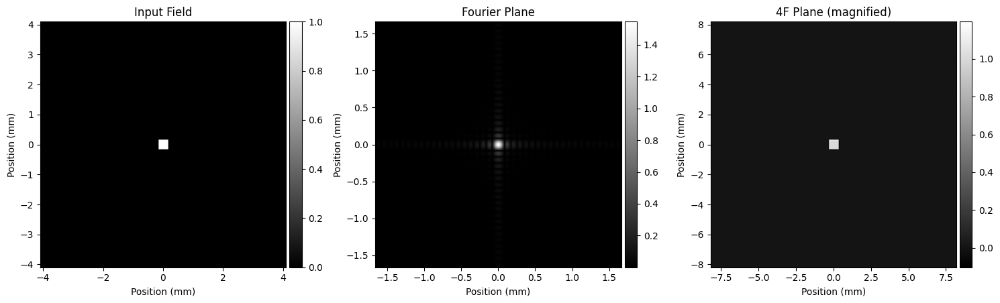

In [30]:
plt.figure(figsize=(15,15))

plt.subplot(131)
field_input.visualize(rescale_factor=0.25, title="Input Field", flag_axis= True)
plt.subplot(132)
fourier_plane.visualize(rescale_factor=0.25,flag_log = False, title= "Fourier Plane", flag_axis= True)
plt.subplot(133)
four_f_plane.visualize(rescale_factor=0.25,title = "4F Plane (magnified)", flag_axis= True)

plt.tight_layout()

# Use the Built In 4F system

In [31]:
# Import a Fourier Lens Component
from holotorch.Optical_Components.Four_F_system import Four_F_system

In [32]:
four_f_system = Four_F_system(
    focallength_1   = 100 * mm,
    focallength_2   = 200 * mm,
    aperture_radius = 0.25 * mm,
)

### Use Single_Image_Dataset to read and process and image

In [33]:
from holotorch.CGH_Datasets.Single_Image_Dataset import Single_Image_Dataset

In [34]:
dataset = Single_Image_Dataset(
    path        = "tiger.png",
    num_pixel_x = 512,
    num_pixel_y = 512,
    grayscale   = True,
) # Dataset spits out a 5D-tensor (TPCHW, but no batch )

In [35]:
data = dataset[0]
print(data.shape)
data = data[None]
# We need to extend the batch dimension since a dataset returns 1 image at a time
print(data.shape)

torch.Size([1, 1, 1, 512, 512])
torch.Size([1, 1, 1, 1, 512, 512])


In [36]:
electric_field : ElectricField = ElectricField(
    data        = data,
    wavelengths = 532 * nm,
    spacing     = 8 * um
    )

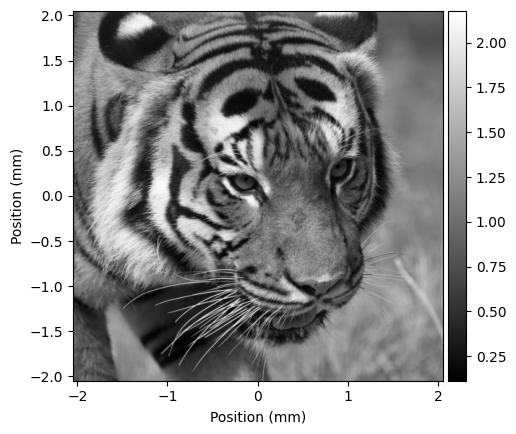

In [37]:
electric_field.visualize(flag_axis=True)

### Pass the electrical field into the four 4 system

In [38]:
four_f_system = Four_F_system(
    focallength_1   = 100 * mm,
    focallength_2   = 200 * mm,
    aperture_radius = 0.15 * mm,
)

In [39]:
field_out = four_f_system( field = electric_field)

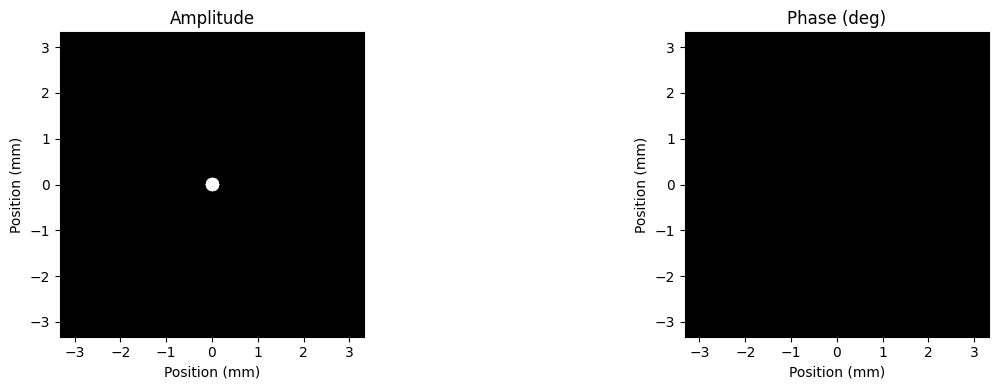

In [40]:
four_f_system.aperture.visualize() 
# We use abberations in the same way was aperture

In [41]:
# Note how the spacing automatically changed
# Holotorch is internally keeping track of the correct spacing!
print(float(electric_field.spacing.data_tensor[...,0]/um),"um")
print(float(field_out.spacing.data_tensor[...,0]/um),"um")

8.0 um
16.0 um


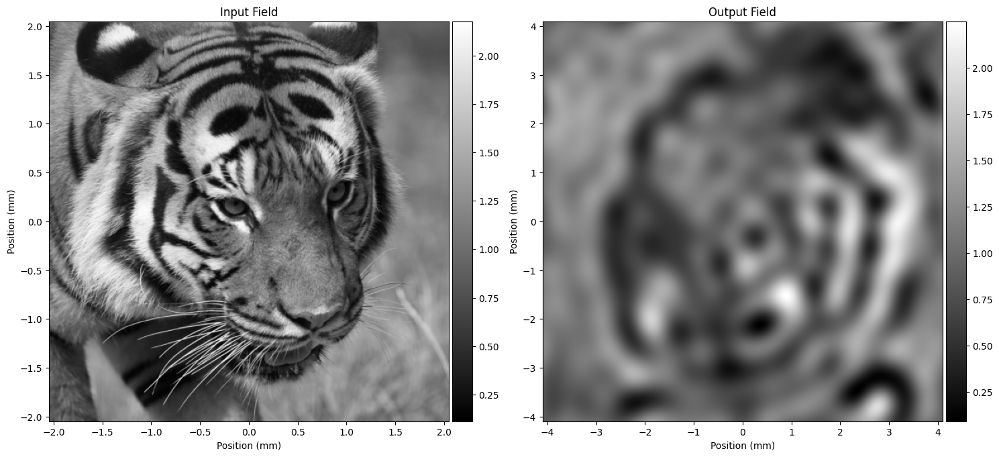

In [42]:
plt.figure(figsize=(15,15))
plt.subplot(121)
electric_field.visualize(title = "Input Field", flag_axis= True)
plt.subplot(122)
field_out.visualize(title = "Output Field", flag_axis= True)
plt.tight_layout() 

# Using Double-Phase-Amplitude-Encoding for Phase-Only Holography

First we reload the image, but this time with non-square dimensions 

torch.Size([1, 1, 1, 1, 1000, 1400])

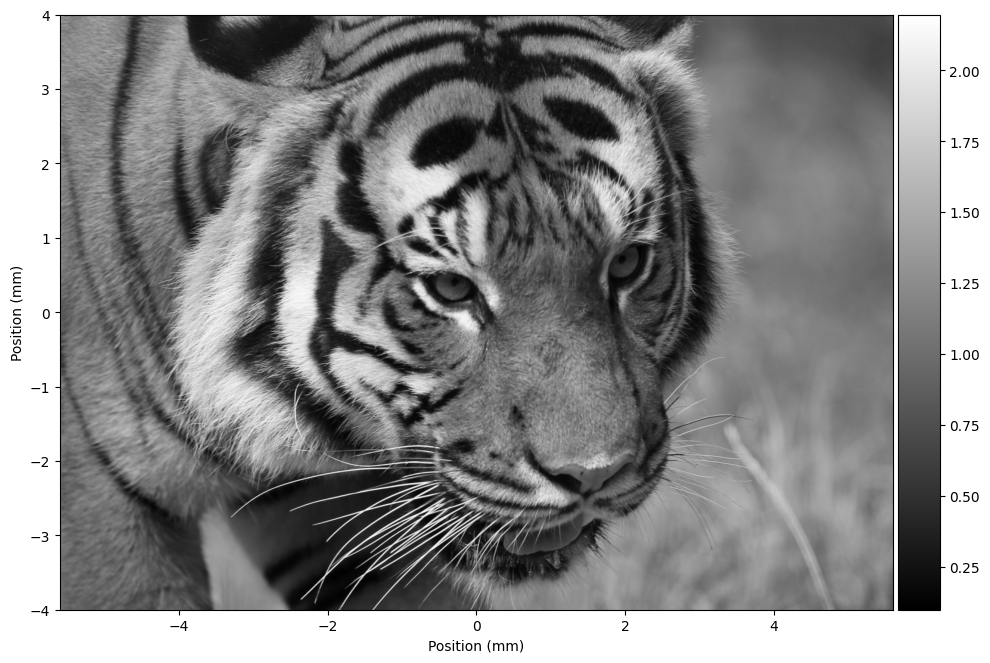

In [43]:
dataset = Single_Image_Dataset(
    path        = "tiger.png",
    num_pixel_x = 1000,
    num_pixel_y = 1400,
    grayscale   = True,
) # Dataset spits out a 5D-tensor (TPCHW, but no batch )

electric_field : ElectricField = ElectricField(
    data        = dataset[0][None],
    wavelengths = 532 * nm,
    spacing     = 8 * um
    )

electric_field.visualize(figsize=(10,10), flag_axis=True)
electric_field.shape

Use the DPAC-class to compute the DPAC-encoding

In [44]:
from holotorch.Optical_Components.DPAC import DPAC
dpac_generator = DPAC()

In [45]:
phase_modulation = dpac_generator.compute_dpac_phase(
                        target_field = electric_field,
                        max_phase   = 2*np.pi 
                        # Max phase that our SLM supports 
                            )

In [46]:
# Compute the electrical field
field = torch.exp(1j * phase_modulation[:,:,None])
# We need to expand the pupil dimension (SLM output is 5D)
print(field.shape)

torch.Size([1, 1, 1, 1, 1000, 1400])


In [47]:
# Parse into an electrical field
dpac_field = ElectricField(
    data        = field,
    wavelengths = 532 * nm,
    spacing     = 8 * um
    )

Visualize the DPAC encoding

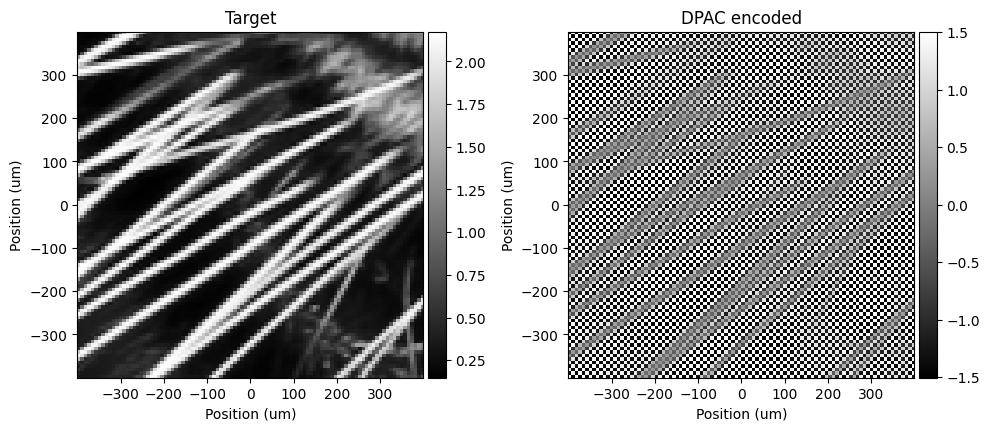

In [48]:
plt.figure(figsize=(10,10))
plt.subplot(121)
electric_field[...,800:900,600:700].abs().visualize(
    flag_axis=True, title = "Target")
plt.subplot(122)
dpac_field[...,800:900,600:700].angle().visualize(
    flag_axis=True, title = "DPAC encoded")
plt.tight_layout()

Initialize the 4-f system

In [49]:
four_f_system = Four_F_system(
    focallength_1   = 100 * mm,
    focallength_2   = 100 * mm,
    aperture_radius = 2.5 * mm,
    flag_flip       = True, 
    # Performs the automatic flip for better visualization
)

Send the DPAC-encoded field through the 4f-system

In [50]:
field_out = four_f_system.forward( field = dpac_field)

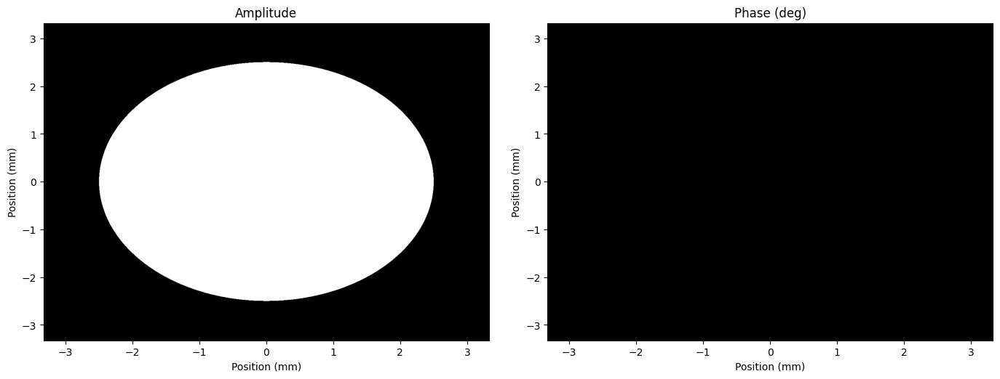

In [51]:
four_f_system.aperture.visualize(figsize=(14,5), flag_colorbar = False)

### What if we want to see what's happening inside the path?

All we need to do is call "add_output_hook" at the corresponding component to visualizing anything happening anywhere inside the path


In [52]:
four_f_system.aperture.add_output_hook()
four_f_system.lens1.add_output_hook()

Now, we just need to call the model again (since we need to populate the outputs)

In [53]:
field_out = four_f_system( field = dpac_field)
# Once an output hook is added,
# every intermediate output will be appended to a list
fourier_plane                 = four_f_system.lens1.outputs[-1] 
fourier_plane_after_aperture  = four_f_system.aperture.outputs[-1]

clear the outputs and delete the handle if no longer needed:

In [54]:
four_f_system.aperture.clear_outputs()
four_f_system.lens1.clear_outputs()
four_f_system.lens1.remove_output_hook()
four_f_system.aperture.remove_output_hook()

Let's have a look at the intermediate output

In [55]:
print(fourier_plane.shape)
print(fourier_plane_after_aperture.shape)

torch.Size([1, 1, 1, 1, 1000, 1400])
torch.Size([1, 1, 1, 1, 1000, 1400])


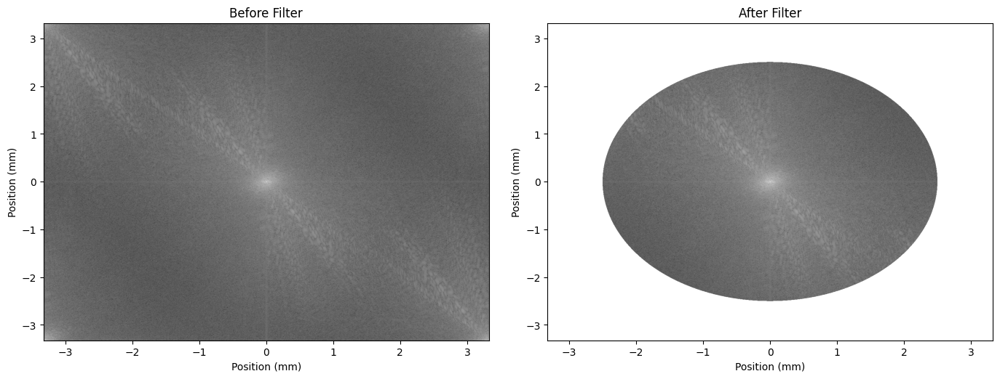

In [56]:
plt.figure(figsize=(14,5))
plt.subplot(121)
fourier_plane.abs().log().visualize(flag_colorbar = False, flag_axis= True, title='Before Filter')
fourier_plane_abs = fourier_plane_after_aperture.abs()
plt.subplot(122)
fourier_plane_after_aperture.abs().log().visualize(flag_colorbar = False, flag_axis= True, title ='After Filter')
plt.tight_layout()

We can even adjust the aspect ratio automatically

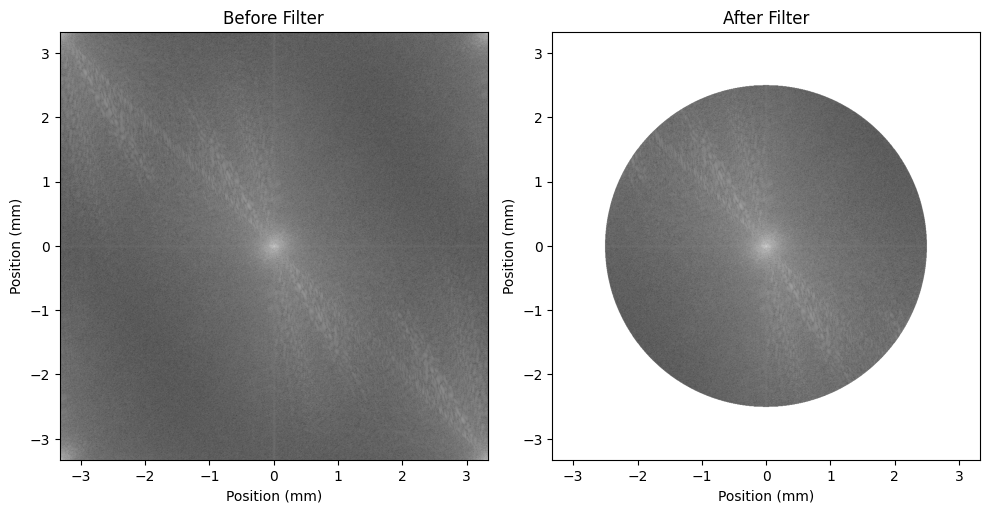

In [57]:
plt.figure(figsize=(10,5))
plt.subplot(121)
fourier_plane.abs().log().visualize(flag_colorbar = False, flag_axis= True, adjust_aspect = True, title='Before Filter')
fourier_plane_abs = fourier_plane_after_aperture.abs()
plt.subplot(122)
fourier_plane_after_aperture.abs().log().visualize( flag_colorbar = False, flag_axis= True, adjust_aspect = True, title ='After Filter')
plt.tight_layout()

Let's look at the final DPAC results

In [58]:
field_out = four_f_system( field = dpac_field)

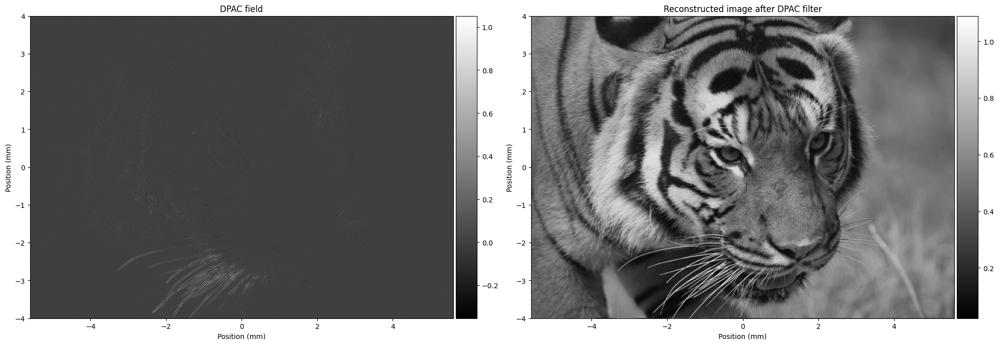

In [59]:
plt.figure(figsize=(20,15))
plt.subplot(121)
dpac_field.rescale(0.5).angle().visualize(flag_axis= True, title = "DPAC field")
plt.subplot(122)
field_out.rescale(0.5).visualize(flag_axis= True, title = "Reconstructed image after DPAC filter")

plt.tight_layout()

# Build a simple phase-retrieval algorithm

<center><img src="images/asm_phase_retrieval.png" width="800"></center>

# Build a simple phase-retrieval algorithm

### Import a few holotorch modules

In [371]:
from holotorch.LightSources.CoherentSource import CoherentSource
from holotorch.Spectra.WavelengthContainer import WavelengthContainer
from holotorch.Spectra.SpacingContainer import SpacingContainer
import holotorch.utils.Dimensions as Dimensions

### Define a source

In [372]:
source = CoherentSource.create(
    height      = 800,
    width       = 1358,
    spacing     = 8 * um,
    wavelengths = (633 * nm),
    n_channel   = 1  # 1 for Grayscale, 3 for RGB
)
# Let's look at the output of our source
source()

holotorch.CGH_Datatypes.ElectricField
Shape of Data Tensor: torch.Size([1, 1, 1, 1, 800, 1358])

Import the Phase-Only SLM Object

In [373]:
from holotorch.HolographicComponents.SLM_PhaseOnly import SLM_PhaseOnly
# Create the SLM object
slm_model = SLM_PhaseOnly.create_slm(
            height          = source.height,
            width           = source.width,
            n_channel       = source.num_channels,
            feature_size    = source.grid_spacing.data_tensor[...,0],
            init_type       = ENUM_SLM_INIT.RANDOM,
            init_variance   = 0.1*np.pi,
            )
slm_model2 = SLM_PhaseOnly.create_slm(
            height          = source.height,
            width           = source.width,
            n_channel       = source.num_channels,
            feature_size    = source.grid_spacing.data_tensor[...,0],
            init_type       = ENUM_SLM_INIT.RANDOM,
            init_variance   = 0.1*np.pi,
            )
slm_model3 = SLM_PhaseOnly.create_slm(
            height          = source.height,
            width           = source.width,
            n_channel       = source.num_channels,
            feature_size    = source.grid_spacing.data_tensor[...,0],
            init_type       = ENUM_SLM_INIT.RANDOM,
            init_variance   = 0.1*np.pi,
            )

print(slm_model)
print(slm_model2)
print(slm_model3)

CLASS Name: SLM_PhaseOnly (extended from Modulator_Container)
-------------------------------------------------------------
number batches: 1
Shape: torch.Size([1, 1, 1, 800, 1358])

CLASS Name: SLM_PhaseOnly (extended from Modulator_Container)
-------------------------------------------------------------
number batches: 1
Shape: torch.Size([1, 1, 1, 800, 1358])

CLASS Name: SLM_PhaseOnly (extended from Modulator_Container)
-------------------------------------------------------------
number batches: 1
Shape: torch.Size([1, 1, 1, 800, 1358])



Visualize the SLM

tensor([[0.2318, 0.1497, 0.2487,  ..., 0.0982, 0.1935, 0.0791],
        [0.2395, 0.1590, 0.3141,  ..., 0.0007, 0.2314, 0.2283],
        [0.0820, 0.2827, 0.0291,  ..., 0.0191, 0.2141, 0.2228],
        ...,
        [0.1411, 0.0600, 0.1947,  ..., 0.0627, 0.1948, 0.0123],
        [0.0932, 0.1989, 0.1434,  ..., 0.2057, 0.1958, 0.0126],
        [0.2716, 0.0929, 0.2805,  ..., 0.3075, 0.1681, 0.0731]])

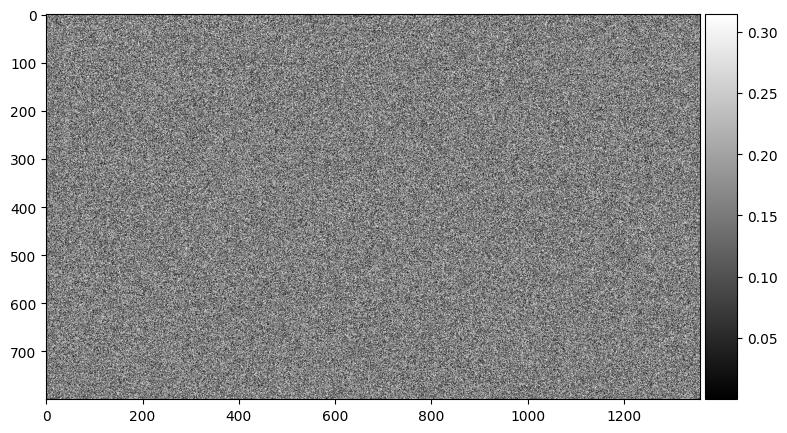

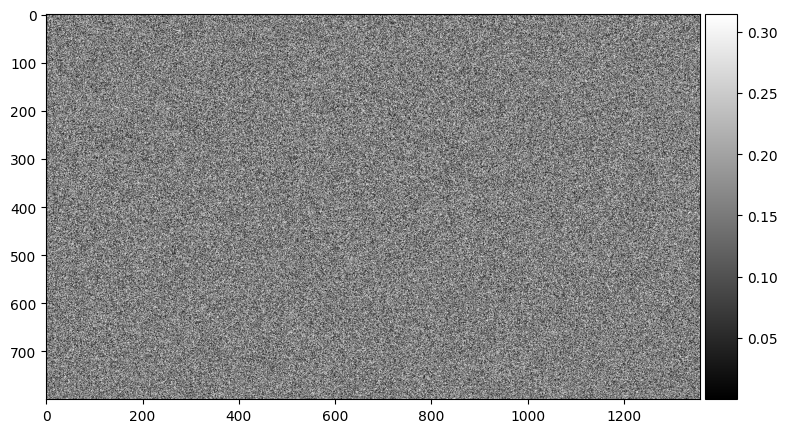

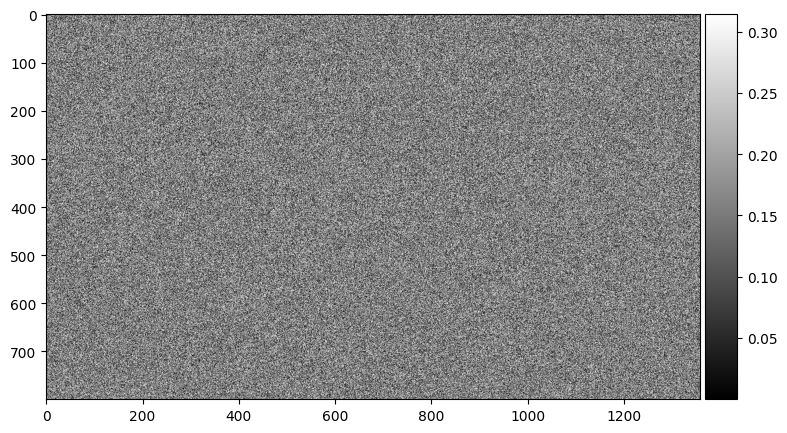

In [374]:
slm_model.visualize_slm(figsize=(15,5), wavelengths = source.wavelengths)
slm_model2.visualize_slm(figsize=(15,5), wavelengths = source.wavelengths)
slm_model3.visualize_slm(figsize=(15,5), wavelengths = source.wavelengths)

Create the Propagator

In [375]:
# Define the propagator
asm_prop = ASM_Prop(
    init_distance = 100*mm,
)

Create a detector

In [376]:
from holotorch.Sensors.Detector import Detector
# Define the detector
detector = Detector(
    color_flag = ENUM_SENSOR_TYPE.TIME_MULTIPLEXED,
    N_pixel_out_x = source.height, # For simplicity we keep input / output the same
    N_pixel_out_y = source.width, # For simplicity we keep input / output the same
)

### Assemble the  complete model

First let's define a NearFieldHologram model

In [377]:
from holotorch.Optical_Setups.Base_Setup import Base_Setup
class NearFieldHologram(Base_Setup):
    """
    NearFieldHologram is a torch-forward model implementing a
    simple optical setup with ASM propagation 
    """
    def __init__(self,
            source          : CoherentSource,
            detector        : Detector,
            slm             : SLM_PhaseOnly,
            propagator      : ASM_Prop,
            ) -> None:
        
        super().__init__()
        
        self.source      = source
        self.detector    = detector
        self.slm         = slm
        self.propagator  = propagator
    
    def forward(self) -> IntensityField:
        src = self.source()
        slm_ = self.slm(src)
        prop = self.propagator(slm_)
        intensity = self.detector(prop)
        return intensity

Let's pass in our components and create the model

In [378]:
hologram_model = NearFieldHologram(
    source     = source,
    detector   = detector,
    slm        = slm_model,
    propagator = asm_prop
)

hologram_model2 = NearFieldHologram(
    source     = source,
    detector   = detector,
    slm        = slm_model2,
    propagator = asm_prop
)

hologram_model3 = NearFieldHologram(
    source     = source,
    detector   = detector,
    slm        = slm_model3,
    propagator = asm_prop
)
hologram_model = hologram_model.cuda()
hologram_model2 = hologram_model.cuda()
hologram_model3 = hologram_model.cuda()
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# hologram_model = hologram_model.to(device)
# hologram_model2 = hologram_model.to(device)
# hologram_model3 = hologram_model.to(device)


In [379]:
# Print out the paramter that will be optimized
hologram_model.print_param_nice()
hologram_model2.print_param_nice()
hologram_model3.print_param_nice()
# The _scale parameter is a secret "sauce" which is useful
# for optimization with phase-only SLMs

slm.values._data_tensor torch.Size([1, 1, 1, 800, 1358]) cuda:0
slm.values._scale torch.Size([1, 1, 1]) cuda:0
slm.values._data_tensor torch.Size([1, 1, 1, 800, 1358]) cuda:0
slm.values._scale torch.Size([1, 1, 1]) cuda:0
slm.values._data_tensor torch.Size([1, 1, 1, 800, 1358]) cuda:0
slm.values._scale torch.Size([1, 1, 1]) cuda:0


In [380]:
hologram_model.print_state_dict_nice()
hologram_model2.print_state_dict_nice()
hologram_model3.print_state_dict_nice()

(0, 'source.wavelengths._data_tensor')
torch.Size([1])
cuda:0
(1, 'source.grid_spacing._data_tensor')
torch.Size([1, 1, 2])
cuda:0
(2, 'slm.upsampler._pixel_fill_ratio')
torch.Size([])
cuda:0
(3, 'slm.values._data_tensor')
torch.Size([1, 1, 1, 800, 1358])
cuda:0
(4, 'slm.values._scale')
torch.Size([1, 1, 1])
cuda:0
(5, 'propagator._z')
torch.Size([])
cuda:0
(0, 'source.wavelengths._data_tensor')
torch.Size([1])
cuda:0
(1, 'source.grid_spacing._data_tensor')
torch.Size([1, 1, 2])
cuda:0
(2, 'slm.upsampler._pixel_fill_ratio')
torch.Size([])
cuda:0
(3, 'slm.values._data_tensor')
torch.Size([1, 1, 1, 800, 1358])
cuda:0
(4, 'slm.values._scale')
torch.Size([1, 1, 1])
cuda:0
(5, 'propagator._z')
torch.Size([])
cuda:0
(0, 'source.wavelengths._data_tensor')
torch.Size([1])
cuda:0
(1, 'source.grid_spacing._data_tensor')
torch.Size([1, 1, 2])
cuda:0
(2, 'slm.upsampler._pixel_fill_ratio')
torch.Size([])
cuda:0
(3, 'slm.values._data_tensor')
torch.Size([1, 1, 1, 800, 1358])
cuda:0
(4, 'slm.values._

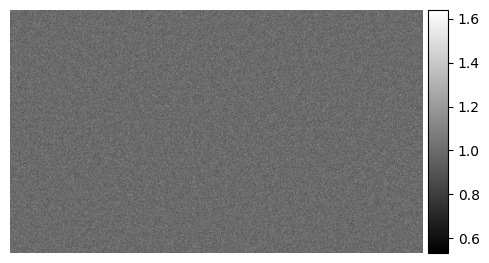

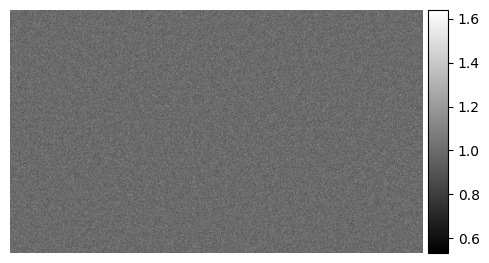

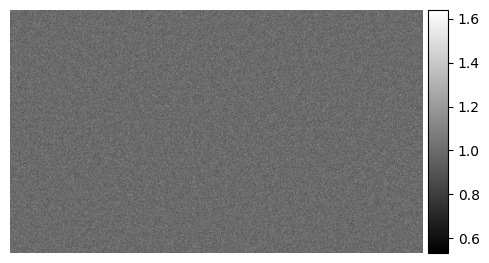

In [381]:
model_out = hologram_model.forward()
model_out.visualize(figsize=(5, 5))

model_out2 = hologram_model2.forward()
model_out2.visualize(figsize=(5, 5))

model_out3 = hologram_model3.forward()
model_out3.visualize(figsize=(5, 5))

### Optimize SLM - Pattern

Step 1: Create the Torch Datamodule
<br>
<font size="3">NOTE: Pytorch-Lightning Datamodules are similair to Torch Dataloaders</br>


In [382]:
from holotorch.CGH_Datasets.Single_Image_Dataset import Single_Image_Dataset
from holotorch.CGH_Datasets.HoloDataModule import HoloDataModule

# dataset_tiger = Single_Image_Dataset(
#     path = "tiger.png",
#     num_pixel_x = detector.N_pixel_out_x,
#     num_pixel_y = detector.N_pixel_out_y,
#     grayscale = False,
# )
#
# dataset_bunny = Single_Image_Dataset(
#     path = "bunny.jpg",
#     num_pixel_x = detector.N_pixel_out_x,
#     num_pixel_y = detector.N_pixel_out_y,
#     grayscale = False,
# )
#
# dataset_panda = Single_Image_Dataset(
#     path = "red_panda.jpg",
#     num_pixel_x = detector.N_pixel_out_x,
#     num_pixel_y = detector.N_pixel_out_y,
#     grayscale = False,
# )

dataset_tiger = Single_Image_Dataset(
    path = "tiger.png",
    # path = "bunny.jpg",
    # path = "red_panda.jpg",
    num_pixel_x = detector.N_pixel_out_x,
    num_pixel_y = detector.N_pixel_out_y,
    grayscale = True,
)

dataset_bunny = Single_Image_Dataset(
    path = "bunny.jpg",
    num_pixel_x = detector.N_pixel_out_x,
    num_pixel_y = detector.N_pixel_out_y,
    grayscale = True,
)

dataset_panda = Single_Image_Dataset(
    path = "red_panda.jpg",
    num_pixel_x = detector.N_pixel_out_x,
    num_pixel_y = detector.N_pixel_out_y,
    grayscale = True,
)


In [383]:
# Create the datamodule
datamodule_tiger = HoloDataModule(dataset = dataset_tiger)
datamodule_bunny = HoloDataModule(dataset = dataset_bunny)
datamodule_panda = HoloDataModule(dataset = dataset_panda)

In [384]:
# Get the intensity-field (which will be used as our target)
tiger = datamodule_tiger.get_batch_IF(batch_idx=0)
bunny = datamodule_bunny.get_batch_IF(batch_idx=0)
panda = datamodule_panda.get_batch_IF(batch_idx=0)


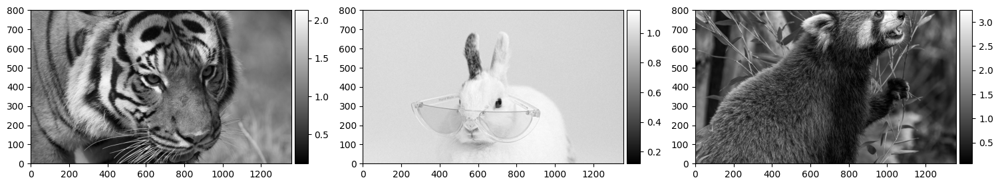

In [385]:
# Visualize the target image
plt.figure(figsize=(15,15))
plt.subplot(131)
tiger.visualize(flag_colorbar = True, flag_axis = True)
plt.subplot(132)
bunny.visualize(flag_colorbar = True, flag_axis = True)
plt.subplot(133)
panda.visualize(flag_colorbar = True, flag_axis = True)
plt.tight_layout()

In [386]:
# Check the device of our target image
print("Device: ", tiger.data.device) # Should be on CPU
print("Device: ", bunny.data.device) # Should be on CPU
print("Device: ", panda.data.device) # Should be on CPU

Device:  cpu
Device:  cpu
Device:  cpu


In [387]:
# Pre-Load Dataset to GPU
datamodule_tiger.preload_dataset(device='cuda:0')
datamodule_bunny.preload_dataset(device='cuda:0')
datamodule_panda.preload_dataset(device='cuda:0')

In [388]:
print("Device: ", datamodule_tiger.get_batch_IF_single(batch_idx=0).data.device)
print("Device: ", datamodule_bunny.get_batch_IF_single(batch_idx=0).data.device)
print("Device: ", datamodule_panda.get_batch_IF_single(batch_idx=0).data.device)
# Note this should be on GPU

Device:  cuda:0
Device:  cuda:0
Device:  cuda:0


Step 2: Create the Lightning Object (that will manage the optimization procedure)

In [389]:
# Import our pre-implemented Lightning-Routine for SLM optimization
from holotorch.Lightning_Modules.SLM_Lightning import SLM_Lightning

Finally create the Lightning Module

In [390]:
slm_lightning_tiger = SLM_Lightning(
    setup       = hologram_model,
    datamodule  = datamodule_tiger,
    lr_slm      = 0.3
)

slm_lightning_bunny = SLM_Lightning(
    setup       = hologram_model2,
    datamodule  = datamodule_bunny,
    lr_slm      = 0.3
)

slm_lightning_panda = SLM_Lightning(
    setup       = hologram_model3,
    datamodule  = datamodule_panda,
    lr_slm      = 0.3
)

<font size="4">Step 2.2: PyTorch Lightning uses Trainer-objects to organize the training loop</font>

In [391]:
import pytorch_lightning
trainer = pytorch_lightning.Trainer(
    enable_progress_bar = True, # for turning off progress bar
    enable_model_summary= False, # for turning off weight summary.
    max_epochs          = 200,
    enable_checkpointing= False,
    gpus                = 1,
    profiler            = None,
    logger              = None
    )

trainer2 = pytorch_lightning.Trainer(
    enable_progress_bar = True, # for turning off progress bar
    enable_model_summary= False, # for turning off weight summary.
    max_epochs          = 200,
    enable_checkpointing= False,
    gpus                = 1,
    profiler            = None,
    logger              = None
    )

trainer3 = pytorch_lightning.Trainer(
    enable_progress_bar = True, # for turning off progress bar
    enable_model_summary= False, # for turning off weight summary.
    max_epochs          = 200,
    enable_checkpointing= False,
    gpus                = 1,
    profiler            = None,
    logger              = None
    )

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True, used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True, used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True, used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Step 3: Run the optimization loop

INFO:pytorch_lightning.accelerators.gpu:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training: 0it [00:00, ?it/s]

Completed


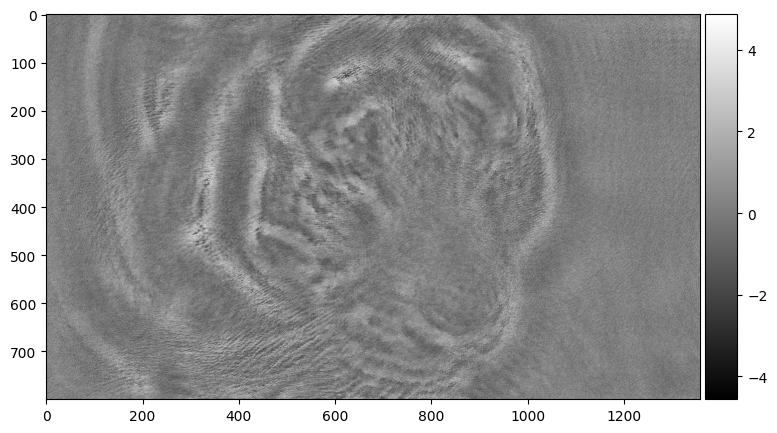

In [392]:
import numpy as np
from scipy.io import savemat

trainer.fit(
    model       = slm_lightning_tiger,
    datamodule  = slm_lightning_tiger.datamodule
)

# slm_lightning_tiger.visualize_loss()

# model_out_ = hologram_model()
# model_out_.visualize(figsize=(10,15),
#                    title = "Model Output Tiger")

data = slm_model.visualize_slm(figsize=(10, 5),wavelengths
                = hologram_model.source.wavelengths)

savemat('tiger_plm.mat', {'slm_data': data})
print("Completed")

INFO:pytorch_lightning.accelerators.gpu:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training: 0it [00:00, ?it/s]

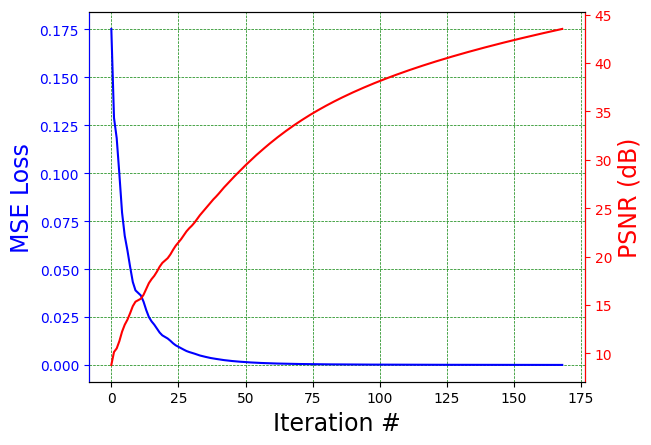

tensor([[0.0571, 0.2684, 0.0649,  ..., 0.2089, 0.0296, 0.1884],
        [0.0764, 0.0363, 0.1685,  ..., 0.0211, 0.0425, 0.2446],
        [0.2878, 0.2040, 0.0988,  ..., 0.2684, 0.0293, 0.0093],
        ...,
        [0.1213, 0.2298, 0.1438,  ..., 0.0116, 0.0129, 0.2712],
        [0.0441, 0.2297, 0.1297,  ..., 0.1570, 0.2097, 0.1254],
        [0.1269, 0.2583, 0.2873,  ..., 0.2517, 0.0998, 0.1269]])

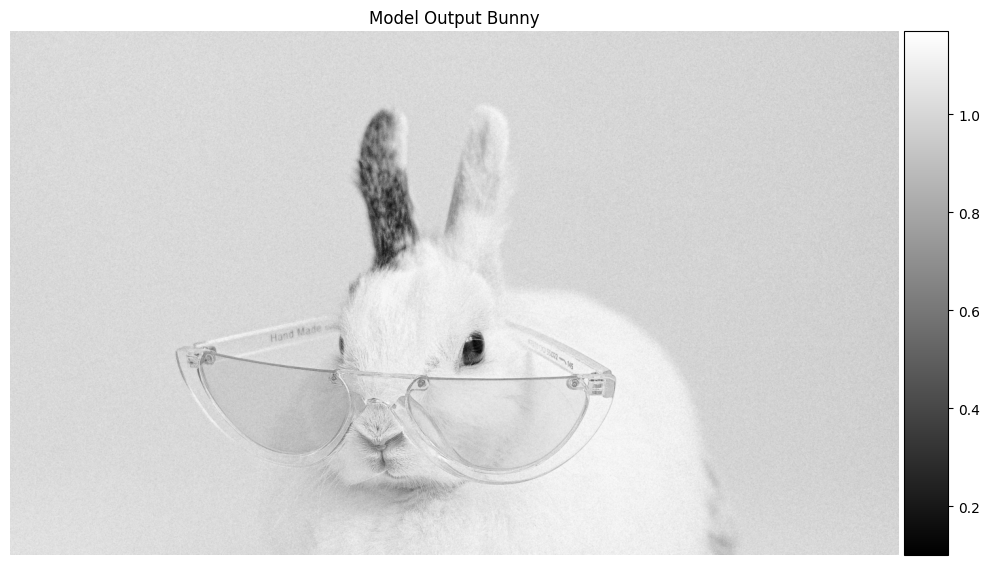

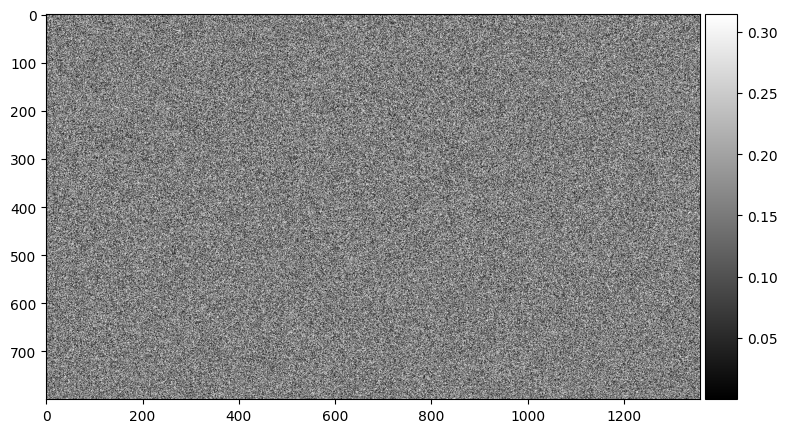

In [393]:
trainer2.fit(
    model       = slm_lightning_bunny,
    datamodule  = slm_lightning_bunny.datamodule
)

slm_lightning_bunny.visualize_loss()

model_out2_ = hologram_model2()
model_out2_.visualize(figsize=(10,15),
                   title = "Model Output Bunny")

slm_model2.visualize_slm(figsize=(15,5),wavelengths
                = hologram_model2.source.wavelengths)


INFO:pytorch_lightning.accelerators.gpu:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training: 0it [00:00, ?it/s]

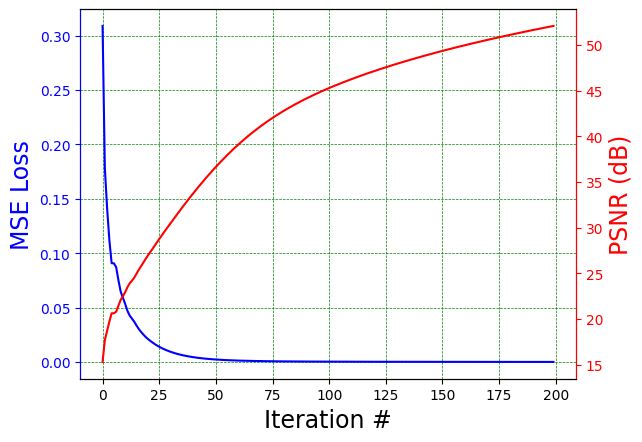

tensor([[0.2318, 0.1497, 0.2487,  ..., 0.0982, 0.1935, 0.0791],
        [0.2395, 0.1590, 0.3141,  ..., 0.0007, 0.2314, 0.2283],
        [0.0820, 0.2827, 0.0291,  ..., 0.0191, 0.2141, 0.2228],
        ...,
        [0.1411, 0.0600, 0.1947,  ..., 0.0627, 0.1948, 0.0123],
        [0.0932, 0.1989, 0.1434,  ..., 0.2057, 0.1958, 0.0126],
        [0.2716, 0.0929, 0.2805,  ..., 0.3075, 0.1681, 0.0731]])

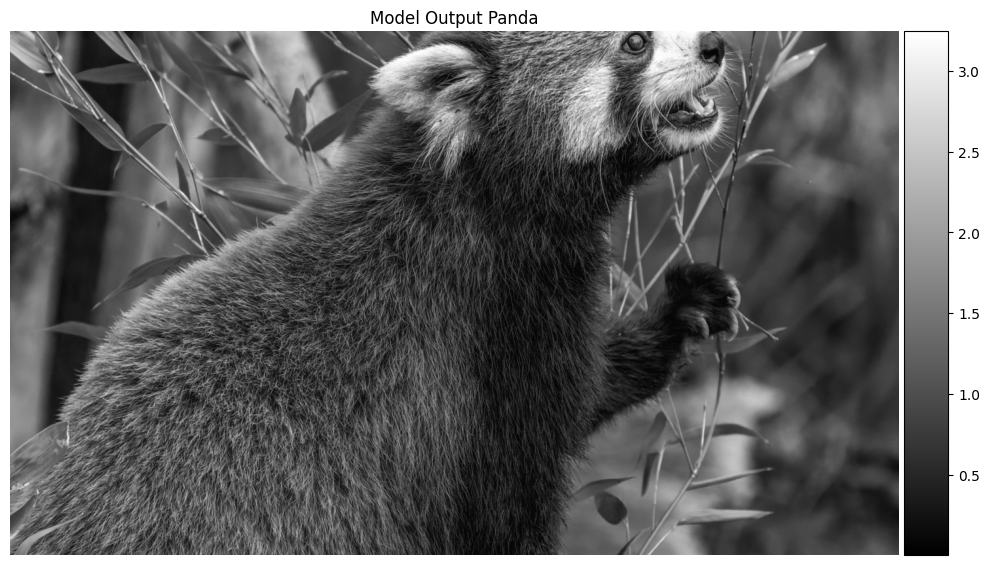

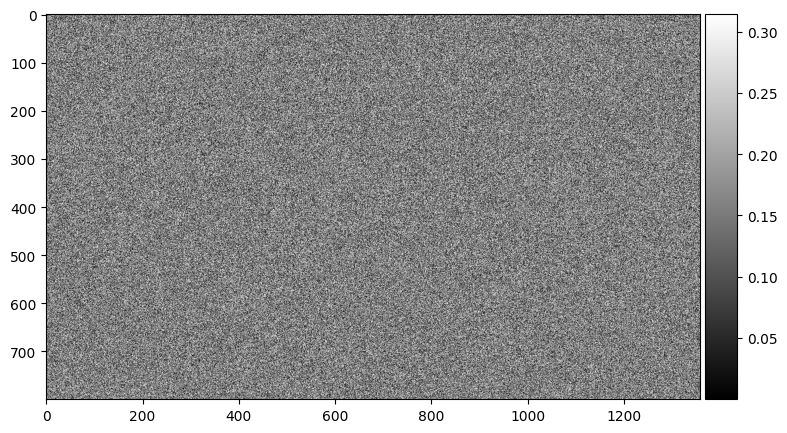

In [394]:
trainer3.fit(
    model       = slm_lightning_panda,
    datamodule  = slm_lightning_panda.datamodule
)
slm_lightning_panda.visualize_loss()

model_out3_ = hologram_model3()
model_out3_.visualize(figsize=(10,15),
                   title = "Model Output Panda")

slm_model3.visualize_slm(figsize=(15,5),wavelengths
                = hologram_model3.source.wavelengths)

## Etendue Expansion - Grace Kuo et al.

<center><img src="images/etendue_expansion.jpg" width="800"></center>

$$ 
I(x) = | FT [ H(u) \cdot S(u) ]|^2
$$

$$
\underset{S}{\mathrm{argmin}}  || \Big( | FT \big( H \cdot U(S) \big) |^2 - T  \Big) \ast p ||^2
$$

$$
x: \text{ Spatial Coordinates} , u: \text{ Spatial Frequency Coordinates}
$$
$$
FT: \text{ Fourier Transform}
$$
$$
H: \text{Expander/Hologram to be optimized}
$$
$$
U: \text{ Upsampling Operator}
$$
$$
T: \text{Target image}
$$
$$
S: \text{ SLM-pattern to be optimized}
$$
$$
p: \text{ Perceptual filter kernel (for incoherent downsampling)}
$$

# Let's create the etendue expansion setup in holotorch

In [395]:
import holotorch.Optical_Setups.Expansion_setup as Expansion_setup

In [396]:
import numpy as np
from holotorch.ComponentWrapper import *

Instead of directly creating our optical components, we will create " parameter dictionaries" which are more structured and easier to automate for parameter sweeps.
<br>
We will then use "factory methods" to create the actual optical components from their parameters dicts.

In [397]:
model_args = PARAM_COMPONENT()
model_args.num_pixel_x = 512
model_args.num_pixel_y = 512
model_args.spacing     = 8 * um
model_args.eFac        = 4 # This means the field will be expanded to 4 * 512, 4 * 512
model_args.wavelengths = 532 * nm

<font size="4">Create the source</font>

In [398]:
# ===========================================================
source = PARAM_SOURCE()
# ===========================================================
source.source_type      = ENUM_SOURCE_TYPE.COHERENT
source.height           = model_args.num_pixel_x
source.width            = model_args.num_pixel_y
source.grid_spacing     = model_args.spacing
source.wavelengths      = model_args.wavelengths

In [399]:
mysource = create_source(source)
print(mysource().data.shape)

torch.Size([1, 1, 1, 1, 512, 512])


<font size="4">Create the SLM</font>

In [400]:
# ===========================================================
slm = PARAM_SLM()
# ===========================================================
slm.num_pixel_x         = model_args.num_pixel_x
slm.num_pixel_y         = model_args.num_pixel_y
slm.feature_size_slm    = model_args.spacing
slm.SLM_TYPE            = ENUM_SLM_TYPE.phase_only
slm.SLM_INIT            = ENUM_SLM_INIT.RANDOM

In [401]:
create_slm(slm) # The SLM output is be a 5D tensor 
# (since the SLM doesn't know about pupil sampling)

CLASS Name: SLM_PhaseOnly (extended from Modulator_Container)
-------------------------------------------------------------
number batches: 1
Shape: torch.Size([1, 1, 1, 512, 512])

<font size="4">Create the expander</font>

In [402]:
# ===========================================================
expander = PARAM_EXPANDER()
# ===========================================================
expander.num_pixel_x             = model_args.num_pixel_x * model_args.eFac
expander.num_pixel_y             = model_args.num_pixel_y * model_args.eFac
expander.spacing                 = source.grid_spacing / model_args.eFac
expander.holo_type               = ENUM_HOLO_TYPE.phase_only
expander.init_type               = ENUM_HOLO_INIT.RANDOM   
expander.center_wavelength       = model_args.wavelengths 
# NOTE: Wavelength is needed for proper 2pi initialization of "random expander phase"

In [403]:
create_expander(expander)

Hologram_Model(
  (Up0): Resize_Field()
  (hoe1): DiffractiveOpticalElement()
)

<font size="4">Create the propagator</font>

In [404]:
# ===========================================================
propagator = PARAM_PROPAGATOR()
# ===========================================================
propagator.focal_length     = 35*mm
propagator.prop_type        = ENUM_PROP_TYPE.FOURIER

In [405]:
create_propagator(propagator)

CLASS Name: FT_Lens (extended from CGH_Component)
-------------------------------------------------------------
Focal Length: 35.0 mm 
Padding: False

Create a detector
NOTE: The detector will automatically downsample the extended hologram back to the original resolution (acts as a perceptual filter)

In [406]:
# ===========================================================
detector = PARAM_DETECTOR()
# ===========================================================
detector.num_pixel_x        = model_args.num_pixel_x
detector.num_pixel_y        = model_args.num_pixel_y

In [407]:
create_detector(detector)

Detector(
  (intensity_operator): IntensityOperator()
  (coordinateSystemCombiner): CoordinateSystemCombiner()
  (pool): AdaptiveAvgPool2d(output_size=[512, 512])
  (wavelength_integrator): IncoherentAverager()
)

# Create the expansion setup from the component list

In [408]:
from holotorch.Optical_Setups.Expansion_setup import Expansion_setup
expansion_cgh = Expansion_setup(
    source      = source,
    slm         = slm,
    expander    = expander,
    propagator  = propagator,
    detector    = detector,
    )

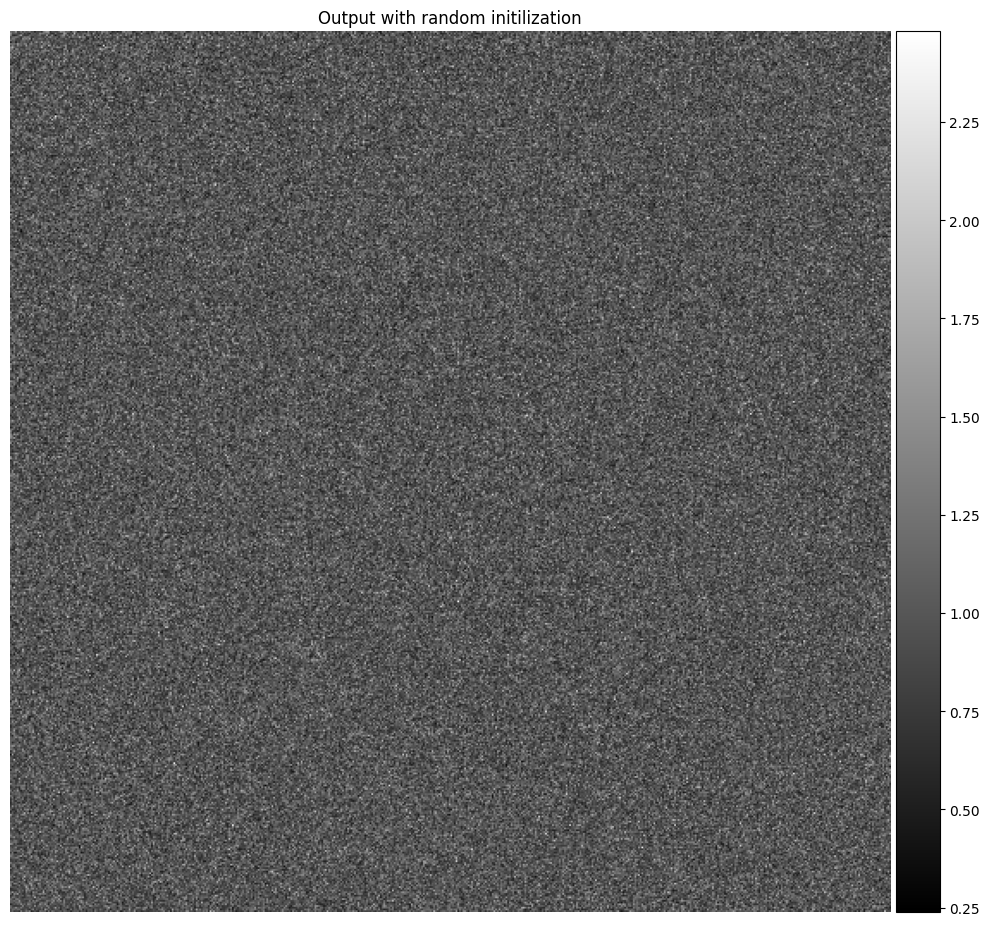

In [409]:
model_out = expansion_cgh.forward()
model_out.visualize(figsize=(10,10), title="Output with random initilization")

#### Define the datamodule with the dataset we want to optimize for

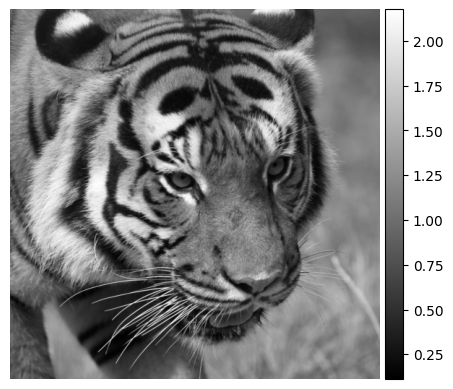

In [410]:
from holotorch.CGH_Datasets.Single_Image_Dataset import Single_Image_Dataset
from holotorch.CGH_Datasets.HoloDataModule import HoloDataModule

dataset = Single_Image_Dataset(
    path = "tiger.png",
    num_pixel_x = model_args.num_pixel_x,
    num_pixel_y = model_args.num_pixel_y,
    grayscale = True,
)

datamodule = HoloDataModule(dataset = dataset)

datamodule.get_batch_IF_single(0).visualize()

#### Create the SLM_Lightning Module (this is actually the same we used before)

In [411]:
from holotorch.Lightning_Modules.SLM_Lightning import SLM_Lightning
import pytorch_lightning

In [412]:
lighting_cgh = SLM_Lightning(
    setup       = expansion_cgh,
    datamodule  = datamodule,
    lr_slm      = 0.1
)

In [413]:
# Create the trainer
trainer = pytorch_lightning.Trainer(
    enable_progress_bar = True, # for turning off progress bar
    enable_model_summary= False, # for turning off weight summary.
    max_epochs          = 100,
    enable_checkpointing= False,
    gpus                = 1,
    profiler            = None,
    logger              = None
    )

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True, used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


#### Run the Optimization

In [414]:
# train the hologram model
trainer.fit(
    model       = lighting_cgh,
    datamodule  = lighting_cgh.datamodule
    )


INFO:pytorch_lightning.accelerators.gpu:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training: 0it [00:00, ?it/s]

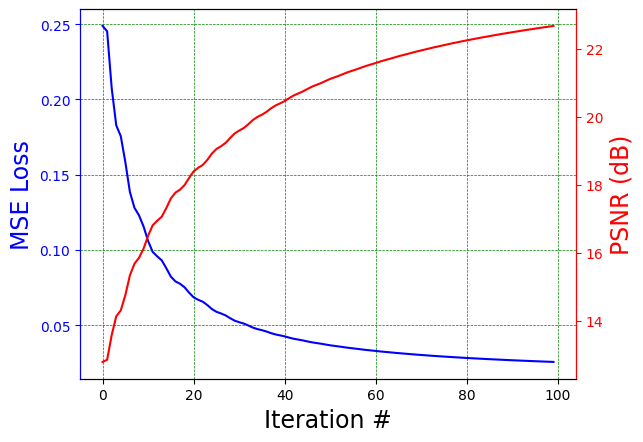

In [415]:
lighting_cgh.visualize_loss()

#### Let us visualize the optimization results

In [416]:
model_expansion_out : IntensityField = expansion_cgh.forward()
target    = lighting_cgh.get_targets(0)

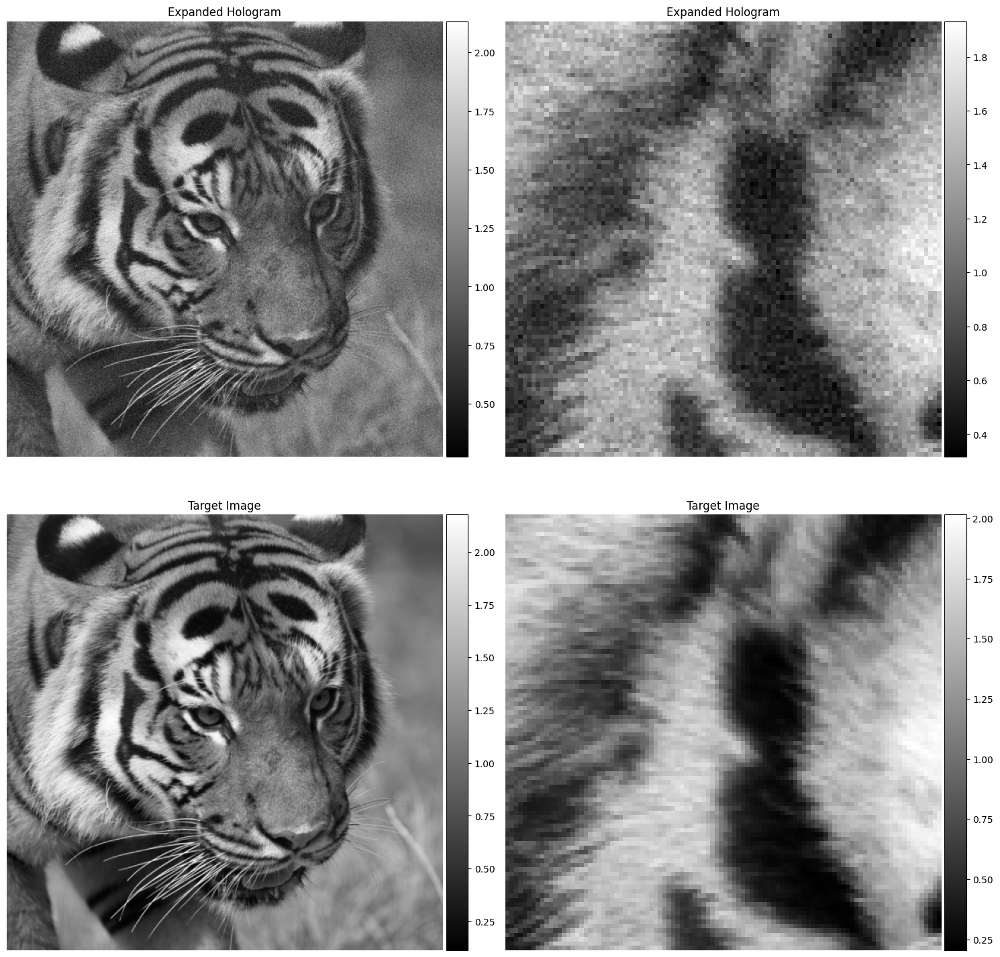

In [417]:
plt.figure(figsize=(15,15))

plt.subplot(221)
model_expansion_out.visualize(title="Expanded Hologram")

plt.subplot(222)
model_expansion_out[...,100:200,100:200].visualize("Expanded Hologram")

plt.subplot(223)
target.visualize("Target Image")

plt.subplot(224)
target[...,100:200,100:200].visualize("Target Image")

plt.tight_layout() 

# Neural Etendue Expansion ( Baek et al.)

<center><img src="images/NeuralEtendueExpansion.png" width="800"></center>

$$
\underset{H, S_{ \{ 1,...,K \} }}{\mathrm{argmin}} \sum_{k=1}^{K} || \Big( | FT \big( H \cdot U(S_k) \big) |^2 - T_k  \Big) \ast p ||^2
$$

$$
FT: \text{ Fourier Transform}
$$
$$
H: \text{ Expander/Hologram to be optimized}
$$
$$
U: \text{ Upsampling Operator}
$$
$$
T_k: \text{ k-th Target image}
$$
$$
S_k: \text{ k-th SLM-pattern to be optimized}
$$
$$
p: \text{ Perceptual filter kernel (for incoherent downsampling)}
$$

# Implementing Neural Etendue Expansion

#### Now it's the first time that we'll use a dataset with more than one sample.

First lets download the DIV2K dataset if we don't already have a copy locally

In [418]:
div2k_extract_path      = pathlib.Path('../ExampleImages/div2k')
div2k_zip_path          = div2k_extract_path / 'div2k.zip'
div2k_image_folder      = div2k_extract_path / 'DIV2K_valid_HR'
div2k_url               = 'http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip'

div2k_extract_path.mkdir(parents=True, exist_ok=True)

Check to see if div2k is already downloaded and extracted, otherwise download it 

In [419]:
# check to see if the image folder is populated with the correct number of files
os.makedirs(div2k_extract_path, exist_ok=True)
im_files = glob.glob( str( div2k_image_folder / '*.png' ) )

if len(im_files) < 10:
    
    # download the div2k zipfile if it doesn't exist yet
    if not div2k_zip_path.is_file():
        response = urllib.request.urlretrieve(div2k_url, div2k_zip_path)
    
    # extract the zipfile into the correct directory
    zipfile.ZipFile(div2k_zip_path).extractall(div2k_extract_path)

BadZipFile: File is not a zip file

Since Neural Etendue expansion easily fills up GPU-memory, we need to be careful with assigning the batch size.

In [ ]:
param_dataset = PARAM_DATASET()
param_dataset.batch_size        = 5 
param_dataset.data_sz           = 15 # For this tutorial we keep the total number of samples small
param_dataset.color_flag        = ENUM_SENSOR_TYPE.MONOCHROMATIC
param_dataset.num_pixel_x       = model_args.num_pixel_x
param_dataset.num_pixel_y       = model_args.num_pixel_y
param_dataset.TYPE_dataloader   = ENUM_DATASET.DIV2K_Dataset
param_dataset.data_folder       = div2k_image_folder
 
datamodule = Factory_Dataset.create_data_module(param_dataset)
print(datamodule)

#### Pre-loading the dataset to GPU is important if you want to have fast speed. However, this will not work if the dataset doesn't fit into GPU-memory anymore.

In [ ]:
# This might take aa few seconds to process
datamodule.preload_dataset( device= torch.cuda.current_device() )

In [ ]:
test_batch = datamodule.get_batch_IF(batch_idx=0)
print(test_batch)
test_batch.visualize_grid(figsize = (20,8), num_row = 1, num_col = 5, flag_colorbar = False)

In [ ]:
test_batch = datamodule.get_batch_IF(batch_idx=1)
print(test_batch)
test_batch.visualize_grid(figsize = (10,10), 
                          num_row = 1, num_col = 4,
                          flag_colorbar = False)

In [ ]:
test_batch = datamodule.get_batch_IF(batch_idx=2)
print(test_batch)
test_batch.visualize_grid(figsize = (10,10), 
                num_row = 2, num_col = 2, flag_colorbar = False)

### Initialize the SLM

In [ ]:
# ===========================================================
slm = PARAM_SLM()
# ===========================================================
slm.num_pixel_x         = model_args.num_pixel_x
slm.num_pixel_y         = model_args.num_pixel_y
slm.feature_size_slm    = model_args.spacing
slm.SLM_TYPE            = ENUM_SLM_TYPE.phase_only
slm.SLM_INIT            = ENUM_SLM_INIT.RANDOM
slm.n_slm_batches       = datamodule.number_batches
slm.data_sz             = len(datamodule)

NOTE: During optimization we need to save the "state" of each SLM. If the dataset size is small, we can do this on GPU. However, once the dataset becomes too large, we need to store the states of the SLM on disk.

<br>
Our SLM-class is able to take care of this automatically. You don't have to worry about this.

In [ ]:
test_slm = create_slm(slm)
print(test_slm) # The SLM should now carry 3 SLMs since the datamodule has 3 batches too
print(datamodule)

# Let's assemble the expansion setup

#### NOTE: We have defined an Expansion_Setup earlier and you only need to pass parameters to it

In [ ]:
neural_expansion_cgh = Expansion_setup(
    source      = source,
    slm         = slm,
    expander    = expander,
    propagator  = propagator,
    detector    = detector,
    ).cuda()

In [ ]:
neural_expansion_cgh.print_param_nice()

# Let's initialize the Neural_Expander_Lightning

NOTE: For Neural etendue expansion we iterate between optimizing the expander and optimizing the SLM-patterns for each image in the dataset.
<br>
We need a initialize a lot of ADAM-optimizers and keep track of many different parameters. 
<br>
We have implemented all of this in *Neural_Expander_Lightning* for you

In [ ]:
from holotorch.Lightning_Modules.Neural_Expander_Lightning import Neural_Expander_Lightning

In [ ]:
neural_expander_lighnting = Neural_Expander_Lightning(
    datamodule  = datamodule,
    setup       = neural_expansion_cgh,
    lr_expander = 0.25 * 1e-2,
    lr_slm      = 0.25,
    num_preinitialize = 25
).cuda()

In [ ]:
# Create the trainer
trainer = pytorch_lightning.Trainer(
    enable_progress_bar = True, # for turning off progress bar
    enable_model_summary= False, # for turning off weight summary.
    max_epochs          = 100,
    enable_checkpointing= False,
    gpus                = 1,
    profiler            = None,
    logger              = None
    )

### Run the optimization

In [ ]:
# train the hologram model
trainer.fit(
    model       = neural_expander_lighnting,
    datamodule  = neural_expander_lighnting.datamodule
    )

In [ ]:
neural_expander_lighnting.visualize_loss()

In [ ]:
neural_expansion_cgh.forward(batch_idx=1).visualize_grid(max_images=5,
                                              num_row = 1, num_col = 4)

In [ ]:
neural_expansion_cgh.forward(batch_idx=2).visualize_grid(max_images=5)

### What about saving and loading our models?

In [ ]:
import pathlib
save_folder = pathlib.Path(".//results//neural_expansion")
# Holotorch uses pathlib a lot

In [ ]:
neural_expander_filename = save_folder / "neural_expansion.ht"
neural_expansion_cgh.save_model(neural_expander_filename)

We also need to save the different SLM batches indiviually

In [ ]:
slm_folder = save_folder / "optimized_slms"
print(slm_folder.resolve())

In [ ]:
neural_expansion_cgh.slm.save_all_slms_into_folder(slm_folder)

In [ ]:
from os import walk
filenames = next(walk(slm_folder), (None, None, []))[2]  # [] if no file
print(filenames)

How can we load our model again?

In [ ]:
optimized_neural_etendue_setup = Base_Setup.load_pickle_object(neural_expander_filename)

In [ ]:
print(slm_folder)
optimized_neural_etendue_setup.slm.load_all_slms_from_folder(slm_folder) # 

In [ ]:
neural_expansion_output = optimized_neural_etendue_setup.forward(batch_idx=1)
neural_expansion_output.visualize_grid(max_images=5, num_row = 1, num_col = 5)

In [ ]:
neural_expansion_output = optimized_neural_etendue_setup.forward(batch_idx=0)
neural_expansion_output.visualize_grid(max_images=5, num_row = 1, num_col = 4)

# Let's compare against conventional "etendue expansion"

In [ ]:
# FIRST: Let's move the place where we store the "temporary" SLM-states for Neural Etendue Expansion
print("Folder before move:", optimized_neural_etendue_setup.slm.tmp_dir)
optimized_neural_etendue_setup.slm.move_tmp_save_folder(slm_id="neural_expansion")
print("Folder after move:",optimized_neural_etendue_setup.slm.tmp_dir)

In [ ]:
 # Specify where we save the SLM states to avoid conflict
slm.slm_id = "simple_expansion"
expansion_cgh = Expansion_setup(
    source      = source,
    slm         = slm,
    expander    = expander,
    propagator  = propagator,
    detector    = detector,
    ).cuda()

print("New Save Folder", expansion_cgh.slm.tmp_dir)

In [ ]:
# Just to make sure we're still using the correct datamodule
print(datamodule)

In [ ]:
lighting_cgh = SLM_Lightning(
    setup       = expansion_cgh,
    datamodule  = datamodule,
    lr_slm      = 0.1
)

In [ ]:
# Create the trainer
trainer = pytorch_lightning.Trainer(
    enable_progress_bar = True, # for turning off progress bar
    enable_model_summary= False, # for turning off weight summary.
    max_epochs          = 50,
    enable_checkpointing= False,
    gpus                = 1,
    profiler            = None,
    logger              = None
    )

In [ ]:
# train the hologram model
trainer.fit(
    model       = lighting_cgh,
    datamodule  = lighting_cgh.datamodule
    )

In [ ]:
lighting_cgh.visualize_loss()

Visualize the output of neural and conventional etendue expansion

In [ ]:
batch_idx_to_visualize = 1

# Get the ground truth
ground_truth = datamodule.get_batch_IF(batch_idx=batch_idx_to_visualize)

# Get the normal etendue expansion output
normal_expansion_output = expansion_cgh.forward(batch_idx=batch_idx_to_visualize)
normal_expansion_output.visualize_grid(max_images=5, num_row = 1, num_col = 4, vmin = 0)

# Get the neural etendue expansion output
neural_expansion_output = optimized_neural_etendue_setup.forward(batch_idx=batch_idx_to_visualize)
neural_expansion_output.visualize_grid(max_images=5, num_row = 1, num_col = 4, vmin = 0)

Let's look at single out

In [ ]:
img_idx = 0
plt.figure(figsize=(15,15))
plt.subplot(131)
ground_truth[0].visualize(title='Ground Truth', flag_colorbar = False)
plt.subplot(132)
normal_expansion_output[img_idx].visualize(title='Simple Expansion', flag_colorbar = False, vmin = 0)
plt.subplot(133)
neural_expansion_output[img_idx].visualize(title='Neural Expansion', flag_colorbar = False, vmin = 0)

plt.tight_layout()

Let's zoom into to see the difference in noise

In [ ]:
plt.figure(figsize=(15,15))
img_idx = 4
x0 = 50
x1 = 150
y0 = 200
y1 = 300
plt.subplot(311)
ground_truth[img_idx,...,x0:x1,y0:y1].visualize(title='Ground Truth', flag_colorbar = False)
plt.subplot(312)
normal_expansion_output[img_idx,...,x0:x1,y0:y1].visualize(title='Simple Expansion', flag_colorbar = False)
plt.subplot(313)
neural_expansion_output[img_idx,...,x0:x1,y0:y1].visualize(title='Neural Expansion', flag_colorbar = False)

plt.tight_layout()

Holotorch

A coherent imaging/display framework in progress

Contact:
<br>
Florian Schiffers: florian.schiffers@u.northwestern.edu
<br>
Oliver Cossairt: oliver.cossairt@northwestern.edu

GitHub Link: https://github.com/facebookresearch/holotorch